<a href="https://colab.research.google.com/github/dingowhiz/Data_Analytics_ML/blob/main/Nile.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

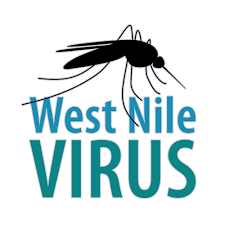
#  Chicago West Nile Virus Outbreak Predictor       

## Predict the spread of West Nile Virus in Chicago, USA using Machine Learning binary classification models
### @author: Russell Tang


---




## Objective

* West Nile disease is an infection originated in Africa and caused by mosquito-borne virus transmitted from mosquito to human. 
* The objective of this project is to use Machine Learning model/s to predict the presence and spread of West Nile virus in the Chicago area in IL.
* Tasks include exploring, analysing and transforming historical data of geographical spread of West Nile Mosquito given by the Chicago Department of Public Health (CDPH) https://www.chicago.gov/content/city/en/sites/covid-19/home.html in 2007~2014

Data source consists of four datasets in csv format:-
* train.csv (2007, 2009, 2011 & 2013)
* test.csv (2008, 2010, 2012 & 2014)
* spray.csv (2011~2013)
* weather.csv (2007~2014)

The expected deliverable of this project is a Jupyter Notebook demonstrating the working and result of a mathematical models for 
predicting the spread of West Nile Virus in the test dataset.

This notebook serves as a model for data validation, it starts with exploratory data analysis (EDA), feature engineering, model training, model validation, model scoring and evaluation.     


---



# Track Datasets

* Given datasets :- train.csv
* **Characteristics or dependent variables:-** Address, Species, Temperature, DewPoint, SnowFall, Precipitation, Pressure, Heat, Sunrise, Sunset, Date
* **Target feature:-** WnvPresent



### Import Python dependencies and load dataset 

In [ ]:
# Import Dependencies
%matplotlib inline

# Start Python Imports
import sys
import math, time, random, datetime

# Data Manipulation
import numpy as np
import pandas as pd
from numpy import vstack
from numpy import hstack
from pandas.api.types import is_numeric_dtype
import datetime 
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline


import sklearn
from sklearn.metrics import confusion_matrix, make_scorer, accuracy_score
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.impute import SimpleImputer
import joblib
from joblib import dump, load

# Visualization 
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px
plt.style.use('seaborn-whitegrid')

# Preprocessing
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize, MinMaxScaler

# Machine learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import initializers
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adadelta, Adagrad, Adamax, Nadam, Ftrl
from keras.regularizers import l1, l2, l1_l2
from keras.callbacks import EarlyStopping

from sklearn.model_selection import StratifiedKFold
from keras.layers import LeakyReLU
LeakyReLU = LeakyReLU(alpha=0.1)

# Let's ignore warnings for now
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# load dataset                              
#subj_df = pd.read_csv('/content/drive/MyDrive/SFT Machine Learning/Data Compiled/BVH_Starmed/1 Batch-1 Machine_Smooth/BVH-Starmed-9000-smooth-2006-1007_Train.csv')
df_train = pd.read_csv('/content/drive/MyDrive/SparkBeyond/train.csv')
df_spray = pd.read_csv('/content/drive/MyDrive/SparkBeyond/spray.csv')
df_weather = pd.read_csv('/content/drive/MyDrive/SparkBeyond/weather.csv')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
#subj_df = pd.concat([subj_df1, subj_df2, subj_df3, subj_df5])

print('Shape of training dataset: ', df_train.shape)
print(df_train.info())
display(df_train.head(3))
print('\n')

print('Shape of weather dataset: ', df_weather.shape)
print(df_weather.info())
df_weather.head(3)


A quick look at the two dataframes reveals some blank and non-numeric fields in the weather dataset whereas the training dataset looks complete. This will be confirmed in the Clean and Preprocess Data step.

## Plotting the satellite traps on the map

In [ ]:
map_chi = folium.Map(location=[df_train.Latitude.min(), df_train.Longitude.min()],
                                  zoom_start =10)

feature_group = folium.FeatureGroup("Locations")
for lat, lng, name in zip(df_train.Latitude, df_train.Longitude, df_train.Trap):
    feature_group.add_child(folium.Marker(location=[lat,lng],popup=name))

map_chi.add_child(feature_group)
# tooltip = 'Trap One'

# # Circle marker
# folium.CircleMarker([41.954690,	-87.800991],
#                     radius=5,
#                     popup='<strong>Location One</strong>',
#                     tooltip=tooltip,
#                     color='red',
#                     ).add_to(map_hooray)


Map visualisation is limited here due to slow Jupyter notebook performance

## Clean and Preprocess Data
* We will check for missing, duplicate and outlier data. The missing or unwanted data will either be dropped or imputed.
* Weather data for Station 1 and 2 are similar. We can use either one of them or use the average of the two sub-datasets. Weather data from Station 1 is chosen.
* Looking at the NCDC form format document 'noaa_weather_qclcd_documentation', the missing or unwanted data are denoted by 'M', '  ', '-','T'. We will replace them with 'NaN's.

In [ ]:
# Check data distribution similarity between Station 1 and 2
# Use Station 1 data only and merge it to the training dataset later
df_stn1 = df_weather[df_weather['Station'] == 1]
df_stn2 = df_weather[df_weather['Station'] == 2]
print('shape of stn1 :', df_stn1.shape, 'stn2 :', df_stn2.shape, '\n')
print('Station 1', '\n', df_stn1.describe(), '\n')
print('Station 2', '\n', df_stn2.describe())



shape of stn1 : (1472, 22) stn2 : (1472, 22) 

Station 1 
        Station        Tmax         Tmin     DewPoint  ResultSpeed    ResultDir
count   1472.0  1472.00000  1472.000000  1472.000000  1472.000000  1472.000000
mean       1.0    75.97894    56.730978    53.377717     6.987092    17.656250
std        0.0    11.50315    10.347907    10.670263     3.586353    10.222077
min        1.0    42.00000    29.000000    22.000000     0.100000     1.000000
25%        1.0    68.00000    49.000000    46.000000     4.400000     7.000000
50%        1.0    78.00000    58.000000    54.000000     6.400000    19.500000
75%        1.0    85.00000    65.000000    61.250000     9.100000    26.000000
max        1.0   103.00000    82.000000    75.000000    24.100000    36.000000 

Station 2 
        Station         Tmax         Tmin     DewPoint  ResultSpeed   ResultDir
count   1472.0  1472.000000  1472.000000  1472.000000  1472.000000  1472.00000
mean       2.0    76.353261    58.889946    53.538043     

In [ ]:
# Check and drop null data in training dataset
df_train = df_train.replace('M', np.NaN)
df_train = df_train.replace(' ', np.NaN)
df_train = df_train.replace('-', np.NaN)
df_train = df_train.replace('T', np.NaN)
df_train = df_train.replace(' T', np.NaN)
df_train = df_train.replace('  T', np.NaN)
n_train = pd.notnull(df_train).sum()
n_null = pd.isnull(df_weather).sum()
print('Number of NaN :', df_train.isnull().values.any().sum())
print(n_train)
df_train = df_train.dropna()

Number of NaN : 0
Date                      10506
Address                   10506
Species                   10506
Block                     10506
Street                    10506
Trap                      10506
AddressNumberAndStreet    10506
Latitude                  10506
Longitude                 10506
AddressAccuracy           10506
NumMosquitos              10506
WnvPresent                10506
dtype: int64


The training dataset is clean without any blank, NaN or string values

In [ ]:
df_stn1.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,0448,1849,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
2,1,2007-05-02,59,42,51,-3,42,47,14,0,0447,1850,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,0446,1851,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9
6,1,2007-05-04,66,49,58,4,41,50,7,0,0444,1852,RA,0,M,0.0,T,29.31,30.05,10.4,8,10.8
8,1,2007-05-05,66,53,60,5,38,49,5,0,0443,1853,,0,M,0.0,T,29.40,30.10,11.7,7,12.0


In [ ]:
# check for blank, NaN, string, zero values in features 'CodeSum' ,'Depth', 'Water1', 'SnowFall' and 'PrecipTotal' 
print('1  ',df_stn1['CodeSum'].unique())
print('2  ',df_stn1['Depth'].unique())
print('3  ',df_stn1['Water1'].unique())
print('4  ',df_stn1['SnowFall'].unique())
print('5  ',df_stn1['PrecipTotal'].unique())

1   [' ' 'BR' 'RA' 'BR HZ' 'RA BR' 'RA VCTS' 'RA HZ' 'TSRA RA BR HZ' 'HZ'
 'TSRA BR HZ' 'TSRA RA BR' 'TSRA RA HZ' 'TSRA BR HZ VCTS' 'TSRA'
 'TSRA BR HZ FU' 'BR HZ FU' 'TSRA RA VCTS' 'HZ VCTS' 'RA BR VCTS'
 'TSRA RA BR VCTS' 'DZ BR' 'TS TSRA RA BR HZ' 'RA BR HZ' 'TSRA RA'
 'TS TSRA RA BR' 'TS RA BR' 'TS TSRA RA' 'TS TSRA RA BR VCTS' 'TS RA'
 'TSRA BR' 'RA DZ FG+ BCFG BR' 'RA FG+ MIFG BR' 'RA DZ' 'RA DZ BR'
 'TSRA RA FG+ FG BR' 'TSRA DZ FG+ FG BR HZ' 'TS TSRA' 'TSRA HZ' 'TS'
 'FG+ BR HZ' 'TS TSRA BR HZ' 'DZ BR HZ' 'TS TSRA BR' 'RA BR FU' 'TS BR HZ'
 'FG+ BR' 'FG+ MIFG BR' 'TSRA RA FG BR' 'DZ' 'RA DZ BR HZ' 'TS BR'
 'TS RA FG+ FG BR' 'RA DZ FG+ FG BR' 'RA BR SQ' 'RA FG BR' 'RA BR HZ FU'
 'MIFG BCFG BR' 'TSRA RA FG+ FG BR HZ' 'TSRA DZ BR HZ'
 'TS TSRA RA FG BR HZ' 'RA DZ FG+ BR' 'TSRA FG+ BR HZ' 'FG+ FG BR HZ'
 'FG BR HZ' 'TS RA BR HZ' 'BCFG BR' 'RA SN']
2   ['0']
3   ['M']
4   ['0.0' '  T' '0.1']
5   ['0.00' '  T' '0.13' '0.38' '0.14' '0.07' '0.02' '1.01' '0.04' '0.01'
 '0.19' '0.39' '0.4

In [ ]:
# Replace blank, null and string values in weather dataset with NaN's
df_stn1 = df_stn1.replace('M', np.NaN)
df_stn1 = df_stn1.replace(' ', np.NaN)
df_stn1 = df_stn1.replace('-', np.NaN)
df_stn1 = df_stn1.replace('T', np.NaN)
df_stn1 = df_stn1.replace(' T', np.NaN)
df_stn1 = df_stn1.replace('  T', np.NaN)
missing = df_stn1[[col for col in df_stn1 if col != 'Date']].isna()
plt.figure(figsize=(16,6))
missing_heatmap = sns.heatmap(missing, linewidth=1, cmap='BuGn_r', annot=True)


In [ ]:
# Check and drop missing, null or blank data in weather dataset and replace them with NaN's

n_null = pd.isnull(df_stn1).sum()
print('Number of NaN :', df_stn1.isna().values.any().sum())
print(n_null)


In [ ]:
df_wea = df_stn1.drop(['Station', 'CodeSum', 'Water1', 'SnowFall', 'Water1', 'Depth'], axis=1)
print(df_stn1.shape)
print(df_wea.shape)
df_wea.head(2)

In [ ]:
df_wea = df_wea.dropna()
print(df_wea.shape)

## Merge training and weather datasets

In [ ]:
df_full = df_train.merge(df_wea, on = 'Date')
print(df_full.shape)
df_full.head()

# Examine the class label imbalance

Let's look at the dataset imbalance:

Total: 8553
    Positive: 432 (5.05% of total)

0    8121
1     432
Name: WnvPresent, dtype: int64


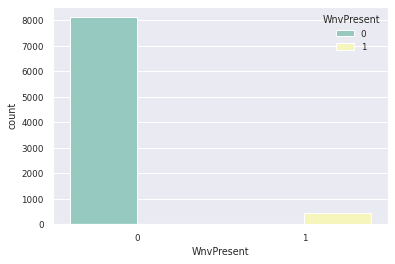

In [ ]:
neg, pos = np.bincount(df_full['WnvPresent'])
total = neg + pos
print('Total: {}\n    Positive: {} ({:.2f}% of total)\n'.format(total, pos, 100 * pos / total))
print(df_full['WnvPresent'].value_counts())
sns.countplot(data=df_full, x=df_full['WnvPresent'], hue='WnvPresent', palette ="Set3")


In [ ]:
def get_undersampled_x_y(data):
  target = 'MvnPresent'

  #Number of data points in the minority class or 1
  num_records_pos = len(df[df[target]==1])
  pos_indices = np.array(df[df[target]==1].index)

  #pick the indices of neg classes
  neg_indices = df[df[target]==0].index

  #out of the indices we picked, randomly select "x" number (num_records_pos)
  random_neg_indices = np.random.choice(neg_indices, num_records_pos, replace=False)
  random_neg_indices = np.array(random_neg_indices)

  #Append two indices
  under_sample_indices = np.concatenate([pos_indices, random_neg_indices])

  #under sample dataset
  under_sample_df = df.iloc[under_sample_indices,:]

  #show ratio
  print("Percentage of negatives:", len(under_sample_df[under_sample_df[target] ==0])/len(under_sample_df))
  print("Percentage of positives:", len(under_sample_df[under_sample_df[target] ==1])/len(under_sample_df))
  print("Total number of rows in resampled dataset:", len(under_sample_df))

  return get_x_y(under_sample_df, target)

def get_x_y(data, target):
  X = df.iloc[:, data.columns!=target]
  Y = df.iloc[:, data.columns == target]
  return X, Y

In [ ]:
#df_stn2 = df_stn1.replace(r'\s{5}(\d+)', r'\1', regex=True)



---



In [ ]:
#df_full.describe(include='all')
df_full.info()

In [ ]:
# Convert feature datatype to integers or floats
df_full['Tavg'] =  df_full['Tavg'].astype(int)
df_full['Depart'] =  df_full['Depart'].astype(int)
df_full['WetBulb'] =  df_full['WetBulb'].astype(int)
df_full['Heat'] =  df_full['Heat'].astype(int)
df_full['Cool'] =  df_full['Cool'].astype(int)
df_full['PrecipTotal'] =  df_full['PrecipTotal'].astype(float)
df_full['StnPressure'] =  df_full['StnPressure'].astype(float)
df_full['SeaLevel'] =  df_full['SeaLevel'].astype(float)
df_full['AvgSpeed'] =  df_full['AvgSpeed'].astype(float)

# Check for duplicate rows

In [ ]:
# check for duplicate data
print('df_full shape :', df_full.shape)
duplicate_rows = df_full[df_full.duplicated()]
print("Number of duplicated rows : ", duplicate_rows.shape[0])

df_full shape : (8553, 28)
Number of duplicated rows :  0


In [ ]:
# drop duplicate rows in the training dataset
df_full = df_full.drop_duplicates()
df_full.shape

(8553, 28)

# Feature Selection/Engineering
Select non string features except for 'Species' which will be encoded to be categorical of integer datatype. The independent variables or feature sets are species, location and weather.

In [ ]:
feature_1 = ['Species', 'Latitude', 'Longitude', 'WnvPresent', 'Tmax', 'Tmin', 'Tavg', 'Depart', 'DewPoint', 'WetBulb', 'Heat', 'Cool', 'PrecipTotal', 'StnPressure', 'SeaLevel', 'ResultSpeed', 'ResultDir', 'AvgSpeed']
df_full2 = df_full[feature_1]

In [ ]:
print('df_full2 shape :', df_full2.shape)
duplicate_rows = df_full2[df_full2.duplicated()]
print("Number of duplicated rows : ", duplicate_rows.shape[0])

## Check for Outliers

In [ ]:
# Check for outliers

def find_outliers(df, target_column):
  zscore = (df[target_column] - df[target_column].mean())/df[target_column].std()
  zscores=zscore.copy()
  zscores.reset_index()
  dataset=sorted(zscores.values)
  q1,q3 = np.percentile(dataset,[25,75])
  iqr=q3-q1
  lower_bound=q1-(1.3*iqr)
  upper_bound=q3+(1.5*iqr)
  print(lower_bound)
  print(upper_bound)

  def autoliresChecker(x,upper_bound=upper_bound,lower_bound=lower_bound):
    if x<lower_bound or x>upper_bound:
      return 1
    else:
      return 0
  outliers = zscore.apply(lambda x: autoliresChecker(x))
  sns.countplot(outliers, label='Counts')
  plt.show()
  return outliers

In [ ]:
out1 = find_outliers(df_full2, 'Tmin')
out1_index = out1[out1 == 1]
df_full2 = df_full2.drop(out1_index.index)
print(df_full2.shape)

out2 = find_outliers(df_full2, 'Tmax')
out2_index = out2[out2 == 1]
df_full2 = df_full2.drop(out2_index.index)

out3 = find_outliers(df_full2, 'Tavg')
out3_index = out3[out3 == 1]
df_full2 = df_full2.drop(out3_index.index)
print(df_full2.shape)
print('Number of Tmin outliers :', sum(out1))
print('Number of Tmax outliers :', sum(out2))
print('Number of Tavg outliers :', sum(out3))

In [ ]:
df_full2.head(2)

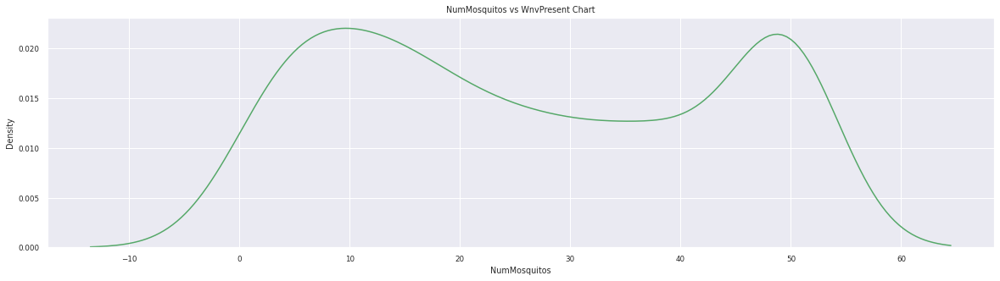

In [ ]:
# Mosquito population vs Presence of WNV
fig, ax = plt.subplots(1,1, figsize=(20,5))
sns.distplot(df_train['NumMosquitos'].where(pd.Series(df_train['WnvPresent'] > 0)), ax=ax,color='g',hist=False)

#ax.xaxis.set(ticks=np.arange(20, 40))
ax.set_title('NumMosquitos vs WnvPresent Chart')

plt.show()

In [ ]:
wn_trap = df_full[['Trap', 'NumMosquitos', 'WnvPresent']].groupby('Trap', as_index=False).sum()
wn_trap.head()

,Trap,NumMosquitos,WnvPresent
0,T001,24,0
1,T002,2571,16
2,T003,1087,13
3,T004,53,0
4,T005,42,2


In [ ]:
trap_002 = df_full[df_full['Trap']=='T002']
trap_002.head()

In [ ]:
trap_002_day = trap_002[['Date', 'NumMosquitos', 'WnvPresent']].groupby('Date', as_index=False).sum()

trap_002_day[trap_002_day['WnvPresent'] > 0]

Text(0.5, 1.0, 'T002 WnvPresent Trend')

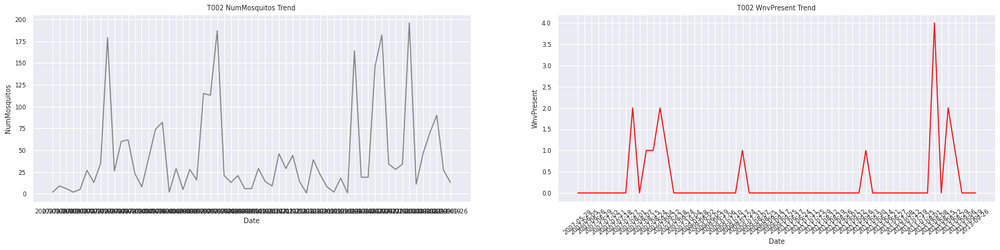

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(25,5))
plt.xticks(rotation=40)
sns.set(font_scale=0.8)
sns.lineplot(ax=ax[0],x=trap_002_day['Date'], y=trap_002_day['NumMosquitos'], color='Grey')
#ax[0].xaxis.set(ticks=np.arange(40,80,5))
ax[0].set_title('T002 NumMosquitos Trend')
sns.lineplot(ax=ax[1],x=trap_002_day['Date'], y=trap_002_day['WnvPresent'], color='Red')
#ax[1].xaxis.set(ticks=np.arange(50,100,5))
ax[1].set_title('T002 WnvPresent Trend')

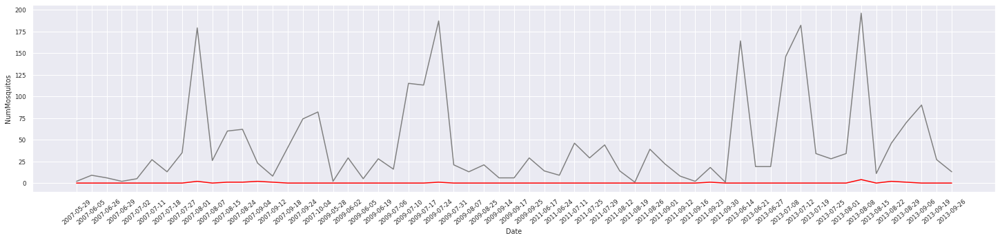

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(25,5))
plt.xticks(rotation=40)
sns.set(font_scale=0.8)
sns.lineplot(x=trap_002_day['Date'], y=trap_002_day['NumMosquitos'], color='Grey')
sns.lineplot(x=trap_002_day['Date'], y=trap_002_day['WnvPresent'], color='Red')

In [ ]:
mos_pop = df_full[['Date', 'NumMosquitos', 'WnvPresent']].groupby('Date', as_index=False).sum()
mos_pop.head()

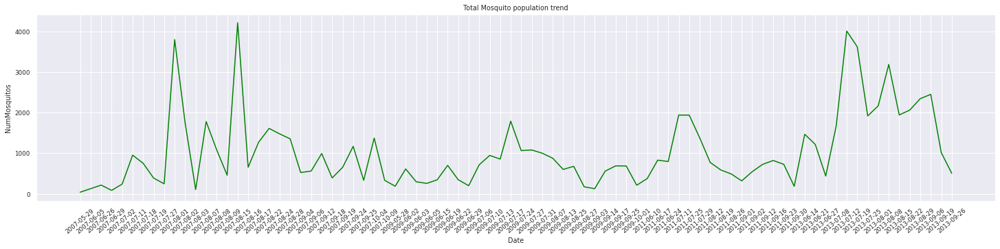

In [ ]:
# Total Mosquito population trend
fig, ax = plt.subplots(1,1, figsize=(25,5))
sns.lineplot(x=mos_pop['Date'], y=mos_pop['NumMosquitos'], color='Green')

plt.xticks(rotation=40)
sns.set(font_scale=0.8)
plt.title('Total Mosquito population trend')
plt.show()

In [ ]:
# WNV Mosquito population trend
fig, ax = plt.subplots(1,1, figsize=(25,5))
sns.lineplot(x=df_train['Date'], y=df_train['NumMosquitos'], color='Red')
sns.scatterplot(x=df_train['Date'], y=df_train['NumMosquitos'].where(pd.Series(df_train['WnvPresent'] > 0)))
plt.xticks(rotation=40)
sns.set(font_scale=0.8)
plt.title('WNV Mosquito population trend')
plt.show()

The spread of West Nile Virus mosquitos tend to peak when the population reaches approximately 10 or 50. This suggests the mosquitos may have gone through multiple breeding cycles during the outbreak even with pesticide spraying.

## EDA

In [ ]:
# Analyse mosquito species with the West Nile Virus count
wn_species = df_full[['Species', 'WnvPresent']].groupby('Species', as_index=False).sum()
wn_species2 = wn_species.where(pd.Series(wn_species['WnvPresent'] > 0)).dropna()
wn_species2.sort_values(by=['WnvPresent'], ascending=False, ignore_index=True)


Three species of mosquitos carry the most West Nile virus. They are in quantity ascending order:-
1. Culex Pipiens/Restuans
2.  Culex Pipiens 
3.  Culex Restuans

Our subsequent analysis and ML model building tasks will focus on these three species of mosquitos

---




In [ ]:
#Visualisation
fig = px.bar(wn_species, x='Species', y='WnvPresent')
fig.update_layout(
    title='West Nile Virus Count vs Species',
    xaxis_title='Species',
    yaxis_title='West Nile Virus Present')
fig.show()

In [ ]:
# Convert 'Species' into categorical data
def convert_species(df):
  assert 'Species' in df.columns
  df.Species[df.Species == 'CULEX ERRATICUS'] = 1
  df.Species[df.Species == 'CULEX PIPIENS'] = 2
  df.Species[df.Species == 'CULEX PIPIENS/RESTUANS'] = 3
  df.Species[df.Species == 'CULEX RESTUANS'] = 4
  df.Species[df.Species == 'CULEX SALINARIUS'] = 5
  df.Species[df.Species == 'CULEX TARSALIS'] = 6
  df.Species[df.Species == 'CULEX TERRITANS'] = 7
  df.Species[df.Species == 'UNSPECIFIED CULEX'] = 8
  return df
df_full2 = convert_species(df_full2)




---



In [ ]:
#Analyse impact of weather on mosquitos and disease
df_full['Tavg'] = df_full['Tavg'].astype(int)
df_full['Depart'] = df_full['Depart'].astype(int)

weather_impact = df_full[['Date', 'Tmin', 'Tmax', 'Depart', 'Tavg', 'DewPoint', 'WetBulb']].groupby(['Date'], as_index = False).mean()

tot_mq = df_full.groupby(['Date'], as_index = False)[['NumMosquitos']].sum()
tot_wn = df_full.groupby(['Date'], as_index = False)[['WnvPresent']].sum()

tot_weather = pd.merge(tot_mq, tot_wn, on = 'Date')
weather_impact_df = pd.merge(weather_impact, tot_weather)

fig = px.scatter(weather_impact_df, x='Tavg', y='NumMosquitos', size='WnvPresent')
fig.update_layout(
    title = 'Mosquitos vs Average Temperature',
    xaxis_title = 'Avaerage Temperature in Fahrenheit',
    yaxis_title = 'Number of Mosquitos'
)
fig.show()

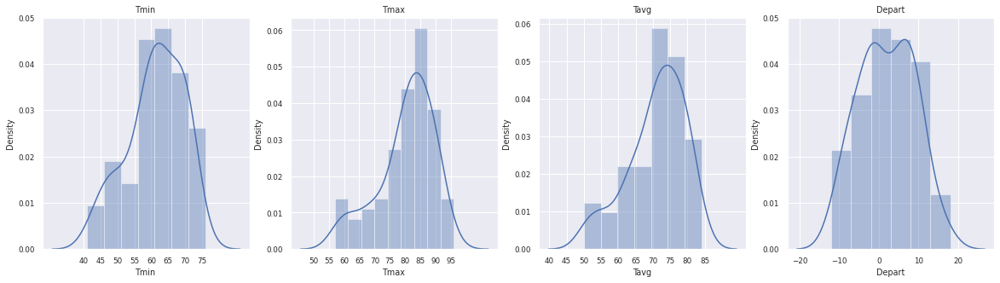

In [ ]:
# Effect of temperature by analysing the distribution of temperatures for min, max and avg versus the WNvirus infection.

fig, ax = plt.subplots(1,4, figsize=(20,5))
sns.distplot(weather_impact_df['Tmin'], ax=ax[0])
ax[0].xaxis.set(ticks=np.arange(40,80,5))
ax[0].set_title('Tmin')

sns.distplot(weather_impact_df['Tmax'], ax=ax[1])
ax[1].xaxis.set(ticks=np.arange(50,100,5))
ax[1].set_title('Tmax')

sns.distplot(weather_impact_df['Tavg'].apply(int), ax=ax[2])
ax[2].xaxis.set(ticks=np.arange(40,90,5))
ax[2].set_title('Tavg')

sns.distplot(weather_impact_df['Depart'].apply(int), ax=ax[3])
ax[3].set_title('Depart')

plt.show()

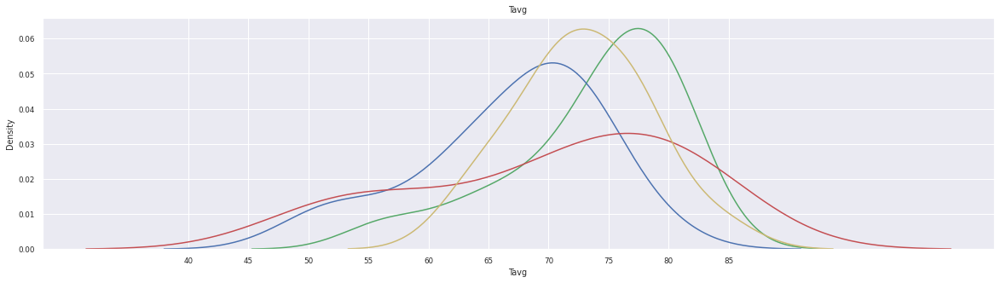

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20,5))
sns.distplot(weather_impact_df['Tavg'].where(pd.Series(weather_impact_df['Date'].str.contains('2007'))), ax=ax,color='g',hist=False)
sns.distplot(weather_impact_df['Tavg'].where(pd.Series(weather_impact_df['Date'].str.contains('2009'))), ax=ax,color='b',hist=False)
sns.distplot(weather_impact_df['Tavg'].where(pd.Series(weather_impact_df['Date'].str.contains('2011'))), ax=ax,color='r',hist=False)
sns.distplot(weather_impact_df['Tavg'].where(pd.Series(weather_impact_df['Date'].str.contains('2013'))), ax=ax,color='y',hist=False)
ax.xaxis.set(ticks=np.arange(40,90,5))
ax.set_title('Tavg')

plt.show()




*   Mosquitos and West Nile Virus thrive in warm and dry weather with **temperature** range of 70-80 degree Fahrenheit. This suggests temperature related independent variables (*Tmin, Tmax, TAvg, Depart*) to be important features in ML models for predicting the target variable, '*WnvPresent*'.
*   The charts show a clear skew with peaks to the right which suggests an increase of West Nile mosquitos as the weather gets warmer and therefore it is presumably **seasonal**. We will need to use a time-series data model to test for seasonality, trend, cyclicality and stationarity. However, we will skip that for the interest of time.




---



In [ ]:
weather_impact_df.head()

In [ ]:
# Moisture content in Atmosphere using DewPoint & WetBulb test
# Density distribution plot to see how are the variables distributed in the space.

fig, ax = plt.subplots(1,2, figsize=(20,5))
sns.distplot(weather_impact_df['DewPoint'], ax=ax[0])
ax[0].set_title('DewPoint')

sns.distplot(weather_impact_df['WetBulb'].dropna().apply(float), ax=ax[1])
ax[1].set_title('WetBulb')
plt.show()

# Analyse Correlation of Variables


# Clean & Preprocess Dataset
## Filtering Data - select West Nile Virus carrying mosquito species

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20,10))
sns.heatmap(df_full2.corr(), annot=True, cmap='YlGnBu_r', ax=ax)
plt.show()

We can see strong correlation between temperature and moisture related features

In [ ]:
df_full2.head()

In [ ]:
# Prepare train datasets
df_full3 = df_full2.copy()
# x_train2 = x_train[x_train['Batch_ID'] == 12112006].reset_index(drop=True) 
# x_train2 = x_train2[x_train2['Spectrometer_ID'] == 'zolix-21083'].reset_index(drop=True)

print(df_full3.shape)
df_full3.head(2)


# Examine the class label imbalance

Let's look at the dataset imbalance:

In [ ]:
# %% Defining synthetic functions
def synthesise(X, y, os=1, us=1):
    over = BorderlineSMOTE(sampling_strategy=os)
    under = RandomUnderSampler(sampling_strategy=us)
    steps = [('o', over), ('u', under)]
    pipeline = Pipeline(steps=steps)
    X, y = pipeline.fit_resample(X, y)
    return (X, y)

In [ ]:
# Use a utility from sklearn to split and shuffle your dataset.
x_train, test_df = train_test_split(df_full3, test_size=0.2, random_state= 42)

x_train, val_df = train_test_split(x_train, test_size=0.2,random_state= 42)

# Form np arrays of labels and features.
y_train = np.int64(x_train.pop('WnvPresent').values)

val_labels = np.int64(val_df.pop('WnvPresent'))
test_labels = np.int64(test_df.pop('WnvPresent'))

x_train, y_train = synthesise(x_train, y_train)
print(x_train.shape)
train_features = np.array(x_train)
val_features = np.array(val_df)
test_features = np.array(test_df)

(9474, 17)


In [ ]:
print('Number of positives :',np.count_nonzero(y_train == 1))
print('Number of negatives :',np.count_nonzero(y_train == 0))

**Scale and Transform data using Standard Scaler**

In [ ]:
# standard scaler transform of the dataset
scaler = StandardScaler()

train_features_fit = scaler.fit_transform(train_features)

val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

#train_features_fit = np.clip(train_features_fit, -5, 5)
#val_features = np.clip(val_features, -5, 5)
#test_features = np.clip(test_features, -5, 5)


In [ ]:
# Converting numpy to tf dataset
def prepare_dataset(data, label, batch, shuffle_buffer):
    dataset = tf.data.Dataset.from_tensor_slices((data, label))
    dataset = dataset.shuffle(shuffle_buffer)
    dataset = dataset.batch(batch).prefetch(1)
    return dataset

In [ ]:
# Preparing dataset
batch_size = 18
buffer = 50
train_dataset = prepare_dataset(train_features_fit, y_train, batch_size, buffer)
valid_dataset = prepare_dataset(val_features, val_labels, batch_size, buffer)

In [ ]:
# Building Model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(
        units=18, 
        kernel_initializer=initializers.HeNormal(),
        #bias_initializer=initializers.Zeros(),
        activation='relu' ), #, kernel_regularizer=keras.regularizers.l1()
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(9, activation='relu'), #, kernel_regularizer=keras.regularizers.l2(0.01)
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(4, activation='relu'), #, kernel_regularizer=keras.regularizers.l2(0.01)
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate = 1e-3,
    decay_steps=10000,
    decay_rate=0.9)

model.compile(
    loss=tf.keras.losses.binary_crossentropy,
    optimizer=tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum = 0.9),
    metrics=['accuracy', 'mae']
)
callback = tf.keras.callbacks.EarlyStopping(patience=350, restore_best_weights=True, monitor='val_accuracy', baseline=0.1, mode = 'min')

history = model.fit(
    train_dataset,
    epochs=350,
    validation_data=valid_dataset,
    callbacks=[callback]
)

Epoch 1/350
527/527 [==============================] - 6s 3ms/step - loss: 0.6703 - accuracy: 0.6308 - mae: 0.4699 - val_loss: 0.9020 - val_accuracy: 0.0454 - val_mae: 0.5923
Epoch 2/350
527/527 [==============================] - 2s 3ms/step - loss: 0.6884 - accuracy: 0.5691 - mae: 0.4868 - val_loss: 0.9721 - val_accuracy: 0.0454 - val_mae: 0.6189
Epoch 3/350
527/527 [==============================] - 2s 3ms/step - loss: 0.6951 - accuracy: 0.5519 - mae: 0.4914 - val_loss: 0.9969 - val_accuracy: 0.0454 - val_mae: 0.6277
Epoch 4/350
527/527 [==============================] - 2s 3ms/step - loss: 0.6970 - accuracy: 0.5453 - mae: 0.4927 - val_loss: 1.0053 - val_accuracy: 0.0454 - val_mae: 0.6307
Epoch 5/350
527/527 [==============================] - 2s 3ms/step - loss: 0.6986 - accuracy: 0.5434 - mae: 0.4936 - val_loss: 1.0075 - val_accuracy: 0.0454 - val_mae: 0.6315
Epoch 6/350
527/527 [==============================] - 2s 3ms/step - loss: 0.6982 - accuracy: 0.5448 - mae: 0.4936 - val_loss

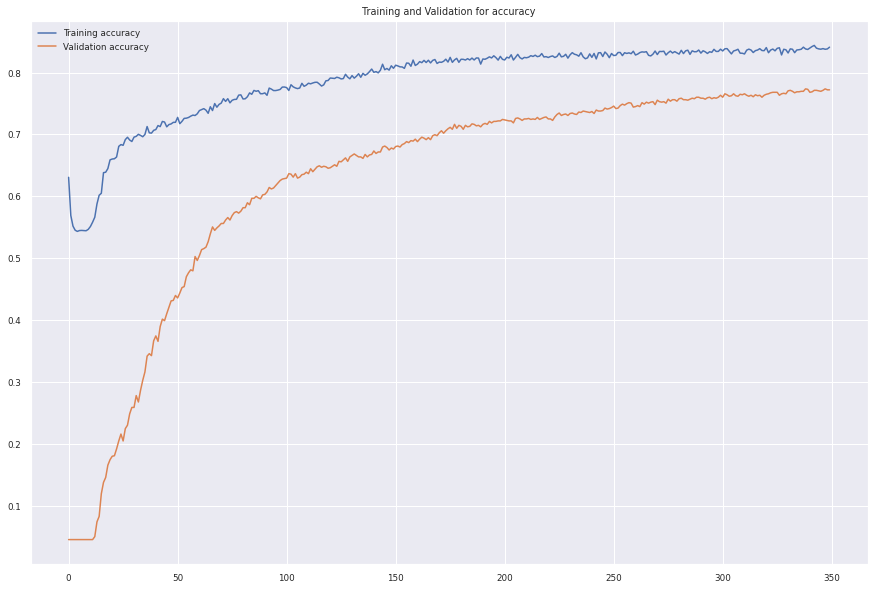

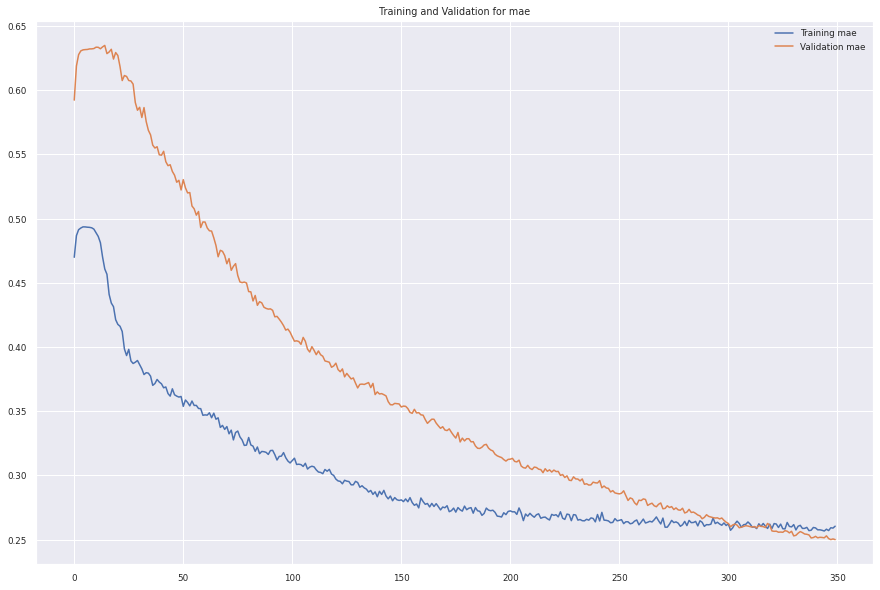

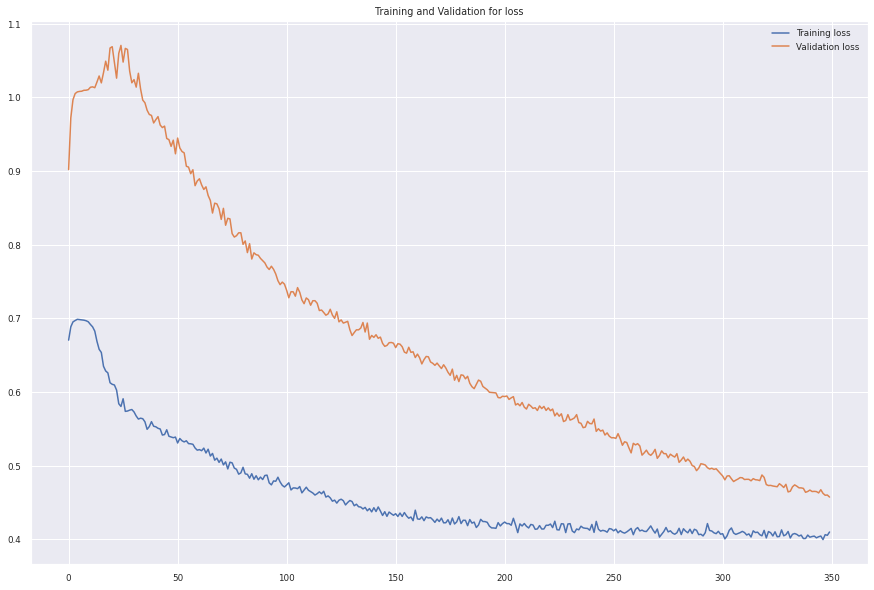

In [ ]:
# Plotting Metrics Curve
plots = ['accuracy', 'mae', 'loss']
for plot in plots:
    metric = history.history[plot]
    val_metric = history.history[f"val_{plot}"]

    epochs = range(len(metric))

    plt.figure(figsize=(15, 10))
    plt.plot(epochs, metric, label=f"Training {plot}")
    plt.plot(epochs, val_metric, label=f"Validation {plot}")
    plt.legend()
    plt.title(f"Training and Validation for {plot}")
    plt.show()




## Cross Validation Prediction

In [ ]:
# Cross-Validation
tab = pd.DataFrame(model.predict(val_features))*100

tab['Actual'] = val_labels
tab = tab.rename(columns = {0 : "Probability"})
tab = tab[['Actual','Probability']]
ttl_pos = tab['Actual'].sum()
ttl_neg = tab.shape[0] - ttl_pos
print('Total Positives :', ttl_pos)
dline = 50
TP_df = tab[(tab['Probability'] > dline) & (tab['Actual'] == 1)].count()
TP = TP_df[0]

TN_df = tab[(tab['Probability'] < dline) & (tab['Actual'] == 0)].count()
TN = TN_df[0]

# TP = ttl_pos - FP
# TN = ttl_neg - FN

print('No. True Positive :', TP)
print('No. True Negative :', TN)
sensitivity = np.round(TP/ttl_pos * 100, 2)
specificity = np.round(TN/ttl_neg * 100, 2)
accuracy = np.round((TP+TN)/tab.shape[0] * 100, 2)

print('Accuracy :', accuracy, '%')
print('Sensitivity :', sensitivity, '%')
print('Specificity :', specificity, '%')
print('Dline :', dline, '%')
tab

Total Positives : 57
No. True Positive : 43
No. True Negative : 926
Accuracy : 77.21 %
Sensitivity : 75.44 %
Specificity : 77.3 %
Dline : 50 %


,Actual,Probability
0,0,8.411246e+01
1,0,8.408778e+01
2,0,6.556598e+01
3,0,4.006705e-01
4,1,7.891236e+00
5,0,1.252112e+00
6,0,1.040712e-07
7,0,1.851728e+01
8,0,3.392262e+01
9,0,4.050637e-03


# **Test Prediction**


In [ ]:
tab2 = pd.DataFrame(model.predict(test_features))*100
tab2['Actual'] = test_labels
tab2 = tab2.rename(columns = {0 : "Probability"})
tab2 = tab2[['Actual','Probability']]
ttl_pos = tab2['Actual'].sum()
ttl_neg = tab2.shape[0] - ttl_pos
print('Total Positives :', ttl_pos)
dline = 50
TP_df = tab2[(tab2['Probability'] > dline) & (tab2['Actual'] == 1)].count()
TP = TP_df[0]

TN_df = tab2[(tab2['Probability'] < dline) & (tab2['Actual'] == 0)].count()
TN = TN_df[0]

# TP = ttl_pos - FP
# TN = ttl_neg - FN

print('No. True Positive :', TP)
print('No. True Negative :', TN)
sensitivity = np.round(TP/ttl_pos * 100, 2)
specificity = np.round(TN/ttl_neg * 100, 2)
accuracy = np.round((TP+TN)/tab2.shape[0] * 100, 2)

print('Accuracy :', accuracy, '%')
print('Sensitivity :', sensitivity, '%')
print('Specificity :', specificity, '%')
print('Dline :', dline, '%')
tab2

Total Positives : 78
No. True Positive : 53
No. True Negative : 1140
Accuracy : 76.04 %
Sensitivity : 67.95 %
Specificity : 76.46 %
Dline : 50 %


,Actual,Probability
0,0,8.533059e+01
1,0,1.061110e+01
2,0,8.704169e-01
3,0,2.373153e+01
4,0,8.332619e+01
5,0,6.006146e-01
6,0,2.267882e+00
7,0,1.591266e+00
8,0,8.692102e+00
9,0,2.320388e+01


In [ ]:
def fit_ml_algo(algo, X_train, y_train, cv):
    
    # One Pass
    model = algo.fit(X_train, y_train)
    acc = round(model.score(X_train, y_train) * 100, 2)
    
    # Cross Validation 
    train_pred = model_selection.cross_val_predict(algo, 
                                                  X_train, 
                                                  y_train, 
                                                  cv=cv, 
                                                  n_jobs = -1)
    # Cross-validation accuracy metric
    acc_cv = round(metrics.accuracy_score(y_train, train_pred) * 100, 2)
    
    return train_pred, acc, acc_cv, model

In [ ]:
# Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import model_selection, tree, preprocessing, metrics, linear_model

start_time = time.time()
train_pred_dt, acc_dt, acc_cv_dt, ml_model1 = fit_ml_algo(DecisionTreeClassifier(), 
                                                                x_train, 
                                                                y_train,
                                                                10)
val_pred_dt, acc_dt_val, acc_cv_dt_val, ml_model2 = fit_ml_algo(DecisionTreeClassifier(), 
                                                                val_features, 
                                                                val_labels,
                                                                10)
test_pred_dt, acc_dt_test, acc_cv_dt_test, ml_model3 = fit_ml_algo(DecisionTreeClassifier(), 
                                                                test_features, 
                                                                test_labels,
                                                                10)
dt_time = (time.time() - start_time)
print("Train Accuracy: %s" % acc_dt)
print("Accuracy CV 10-Fold: %s" % acc_cv_dt)
print("Validation Accuracy: %s" % acc_dt_val)
print("Accuracy CV 10-Fold: %s" % acc_cv_dt_val)
print("Test Accuracy: %s" % acc_dt_test)
print("Accuracy CV 10-Fold: %s" % acc_cv_dt_test)
print('\n',"Running Time: %s" % datetime.timedelta(seconds=dt_time))

Train Accuracy: 99.23
Accuracy CV 10-Fold: 91.75
Validation Accuracy: 99.2
Accuracy CV 10-Fold: 91.0
Test Accuracy: 98.85
Accuracy CV 10-Fold: 91.08

 Running Time: 0:00:01.962566


In [ ]:
# Feature Importance
def feature_importance(model, data):
    """
    Function to show which features are most important in the model.
    ::param_model:: Which model to use?
    ::param_data:: What data to use?
    """
    fea_imp = pd.DataFrame({'imp': model.feature_importances_, 'col': data.columns})
    fea_imp = fea_imp.sort_values(['imp', 'col'], ascending=[True, False]).iloc[-20:]
    _ = fea_imp.plot(kind='barh', x='col', y='imp', figsize=(20, 10))
    return fea_imp

         imp          col
9   0.000000         Heat
5   0.002868         Tavg
11  0.010242  PrecipTotal
8   0.011040      WetBulb
10  0.014430         Cool
13  0.015048     SeaLevel
7   0.019771     DewPoint
15  0.024249    ResultDir
6   0.026376       Depart
14  0.035661  ResultSpeed
12  0.046082  StnPressure
4   0.061963         Tmin
16  0.087896     AvgSpeed
3   0.118286         Tmax
2   0.164286    Longitude
1   0.172991     Latitude
0   0.188811      Species
total % = 0.8111886966057911


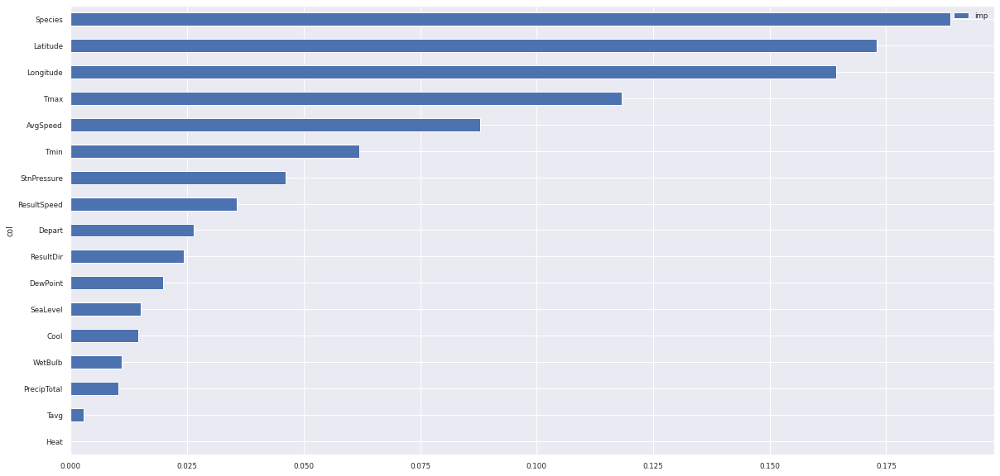

In [ ]:
# Plot the feature importance scores
fea= feature_importance(ml_model1, x_train)
print(fea)
top_16 = fea.values[-16:-1, :1].sum(axis=1)
print('total % =', sum(top_16))

# Testing Prediction using given dataset *test.csv* (2008, 2010, 2012 & 2014)


In [ ]:
test2_df = pd.read_csv('/content/drive/MyDrive/SparkBeyond/test.csv')
print(test2_df.shape)
test2_df.head()

(116293, 11)


,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
2,3,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
3,4,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX SALINARIUS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
4,5,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX TERRITANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


## Merge test and weather datasets

In [ ]:
test2_full = test2_df.merge(df_wea, on = 'Date')
print(test2_full.shape)

(108956, 27)


In [ ]:
test2_full.head(2)

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,86,61,74,7,56,64,0,9,0416,1926,0.00,29.28,29.99,8.9,18,10.0
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,86,61,74,7,56,64,0,9,0416,1926,0.00,29.28,29.99,8.9,18,10.0


In [ ]:
print(set(test2_full['Species']))
print(test2_full['Species'].value_counts())
# test2_full = test2_full[test2_full.Species != 'UNSPECIFIED CULEX']

{'CULEX SALINARIUS', 'CULEX TERRITANS', 'CULEX PIPIENS/RESTUANS', 'CULEX TARSALIS', 'UNSPECIFIED CULEX', 'CULEX RESTUANS', 'CULEX ERRATICUS', 'CULEX PIPIENS'}
CULEX PIPIENS/RESTUANS    14413
CULEX RESTUANS            13743
CULEX PIPIENS             13590
CULEX SALINARIUS          13446
CULEX TERRITANS           13445
CULEX TARSALIS            13441
UNSPECIFIED CULEX         13439
CULEX ERRATICUS           13439
Name: Species, dtype: int64


In [ ]:
# clean and filter trained features in test dataset
print(test2_full.shape)
test2_fea = test2_full.drop(['Id',	'Date',	'Address',	'AddressAccuracy', 'Sunrise', 'Sunset', 'Block',	'Street',	'Trap',	'AddressNumberAndStreet'], axis=1)
test2_fea = convert_species(test2_fea)
print(test2_fea.shape)
test2_fea.head(2)


In [ ]:
#transform test data
test2_features = np.array(test2_fea)
test2_features = scaler.transform(test2_features)

In [ ]:
tab2 = pd.DataFrame(model.predict(test2_features))*100
tab2['Id'] = tab2.index+1

tab2 = tab2.rename(columns = {0 : "Probability"}).round(2)
dline = 50
tab2['WnvPresent'] = np.where(tab2["Probability"] > dline, '1', '0')

tab2 = tab2[['Id', 'WnvPresent', 'Probability' ]]
tab3 = tab2[['Id', 'WnvPresent']]
#tab2.style.hide_index()
#print(tab2.to_string(index=False))

tab3.to_csv('sampleSubmission.csv',index=False)
tab3.head()

# Summary
From the West Nile Virus Predictor model's validation and testing results, we can see that Neural Networks performed reasonably well with train accuracy scores of 84% and validation accuracy score of 77%. When the model is used to predict unseen test data, the accuracy is 71.13% which can be evaluated to have Sensitivity (74.36%) and Specificity (70.96%). Decision Tree performed well as well but evaluation shows significant overfitting in the model. The false prediction in both models can be attributed to the weaker feature sets in the model which can be improved with feature engineering or more data. Another point to note is that any model deployed will have inherent error rate in the virus detection lab test aka accuracy of the ground-truth data.

To further improve the model, we can employ the spray data and train a separate model to predict the test data, feature engineer new features using temperature and/or moisture variables, collect mosquito lavae data using water ponding or building construcion site data or use advanced classification algorithm like deep learning convolutional neural network which has been shown to outperform MLP or decision tree algorithm.

The result of the data and feature importance analysis show that the spread of West Nile virus in Chicago area is very much attributed to the 3 specific species of the mosquitos, weather conditions like temperature levels and wind direction. From the author's introduction, pesticide spraying helped somewhat in controlling the spread of the disease but it did not stem out the population of the Wnv mosquitos. 

From the Trap data analysis, it shows double peak of the virus outbreak which suggests the outbreak is cyclical with multiple breeding periods. Therefore, we would recommend to investigate potential mosquito breeding areas like water ponding, clogged drainage, garden pots, etc. This can be accomplished with public awareness campaign, public enforcement or check at construction sites, drainage systems, roof gutters at houses or self-check at home gardens especially during the dry season. It will take both private resident, community and public work to better control the spread of West Nile Virus and hopefully totally wipe it out. 

From this analysis, it shows that temperature is a key environmental driver of West Nile Virus carrying mosquito population dynamics; understanding its central role is important for these viral spread. Mosquito population responses to temperature fluctuations, though important across the life history, are poorly understood at a population level. 

Because of temperature-dependent shifts in age structure, the abundance of potentially infectious mosquitoes varies temporally, and does not necessarily mirror the dynamics of the total adult population.

More studies is need to better understand the impacts of diurnal and annual temperature fluctuations on mosquito population dynamics. The model allows exploration of temperature-driven temporal changes in adult age structure, giving insights into the population’s capacity to vector West Nile Virus. 



In [7]:
# xgbost
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn import metrics, pipeline
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedKFold, GridSearchCV

In [ ]:
def get_xgb_alg(df):
  # set features and class
  target = "MvnPresent"
  predictors = [x for x in df.columns if x not in [target]]

  # set preprocessors
  min_max_scaler = CustomProcessor(MinMaxScaler(), cols_to_scale, keep_column_names=True)
  binary_encoder = CustomProcessor(ce.BinaryEncoder(cols=cols_to_be), cols_to_be)

  # set constants
  seed=117
  kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

  # Step 0: Get best n_estimators for random initial conditions
  xgb_classifier = XGBClassifier(learning_rate=0.1,
                                 max_depth=8,
                                 min_child_weight=1,
                                 gamma=0.1,
                                 subsample=0.95,
                                 colsample_bytree=0.75,
                                 reg_alpha=0.04,
                                 n_estimators=1000,
                                 objective='binary:logistic',
                                 scale_pos_weight=1,
                                 seed=seed)
  xgb_pipeline = Pipeline([('mms', min_max_scaler),
                           ('xgb', xgb_classifier)])
  
  model.fit(xgb_pipeline, df, predictors)

  # Parameter test 1:
  # max_depth and min_child_weight have the largest effect on the algorithm and are co-dependent
  # Test with step size of 2 and reduce it to 1 in next test

  param_test1 = {
      'xgb__max_depth':list(range(3,14,2)),
      'xgb__min_child_weight': list(range(1,4,2))
  }

  gsearch1 = GridSearchCV(xgb_pipeline, param_grid=param_test1, scoring='roc_auc', cv=kf, verbose=5, iid=False)
  gsearch1.fit(df.drop(target, axis=1), df[target])
  print(gsearch1.cv_results_["params"], gsearch1.best_params_, gsearch1.beset_score_)

  # Parameter test 2:
  # Test around best results of parameter test 1 with finer step size

  md = int(gsearch1.best_params_['xgb__max_depth'])
  mcw = int(gsearch1.best_params_['xgb__min_child_weight'])

  param_test2 = {
      'xgb__max_depth':list(range(md-1, md+2, 1)),
      'xgb__min_child_weight':list(range(mcw-1, mcw+2, 1))
  }

  gsearch2 = GridSearchCV(xgb_pipeline, param_grid=param_test2, scoring='roc_auc', cv=kf, verbose=5, iid=False)
  # ...

  return xgb_pipeline